In [1]:
! lamin load jkobject/scprint

→ connected lamindb: jkobject/scprint


In [1]:
import scanpy as sc

from scprint import scPrint
from scprint.tasks import Embedder

from scdataloader import Preprocessor
from scdataloader.utils import load_genes, translate

import numpy as np
import pandas as pd

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier, HistGradientBoostingClassifier

from scdataloader.utils import get_descendants
from sklearn.metrics import f1_score

import matplotlib.pyplot as plt
from scib_metrics.benchmark import Benchmarker, BioConservation, BatchCorrection

from collections import Counter

%load_ext autoreload
%autoreload 2

import torch
torch.set_float32_matmul_precision('medium')


→ connected lamindb: jkobject/scprint2


KeyboardInterrupt: 

## preparing the model

In [2]:
m = torch.load('../../xzp23r4p.ckpt', map_location=torch.device('cpu'))

In [3]:
model = scPrint.load_from_checkpoint(
    '../../xzp23r4p.ckpt', precpt_gene_emb=None, classes=m['hyper_parameters']['label_counts'], 
)#strict=False)
    #transformer="normal")

FYI: scPrint is not attached to a `Trainer`.


## Loading the data

In [4]:
adata = sc.read(
    "data/pancreas_atlas.h5ad",
    backup_url="https://figshare.com/ndownloader/files/24539828",
)


In [54]:
adata = sc.read(
    "data/kidney_disease.h5ad",
    backup_url="https://datasets.cellxgene.cziscience.com/01bc7039-961f-4c24-b407-d535a2a7ba2c.h5ad",
)


In [21]:
adata = sc.read(
    "data/lung_atlas.h5ad",
    backup_url="https://figshare.com/ndownloader/files/24539942",
)

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/anndata/_io/specs/registry.py:249: OldFormatWarning: Element '/layers' was written without encoding metadata.
  return self.callback(read_func, elem.name, elem, iospec=get_spec(elem))
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/anndata/_io/utils.py:205: OldFormatWarning: Element '/obs/__categories/dataset' was written without encoding metadata.
  return func(*args, **kwargs)
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/anndata/_io/utils.py:205: OldFormatWarning: Element '/obs/dataset' was written without encoding metadata.
  return func(*args, **kwargs)
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/anndata/_io/utils.py:205: OldFormatWarning: Element '/obs/__categories/location' was written without encoding metadata.
  return func(*args, **kwargs)
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/anndata/_io/utils.py:205: OldFormatWarning: Elem

In [106]:
preprocessor = Preprocessor(force_preprocess=True, skip_validate=True, do_postp=False)
adata = preprocessor(adata.copy())
adata

Dropping layers:  KeysView(Layers with keys: )
checking raw counts
removed 18961 non primary cells, 20215 renamining
filtered out 0 cells, 20215 renamining
Removed 0 genes.
startin QC
Seeing 404 outliers (2.00% of total dataset):
done
AnnData object with n_obs × n_vars = 20215 × 70704
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_sta

AnnData object with n_obs × n_vars = 20215 × 70704
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'nnz', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts

In [19]:
adata.obs['organism_ontology_term_id'] = "NCBITaxon:9606"
preprocessor = Preprocessor(use_layer='counts', is_symbol=True, force_preprocess=True, skip_validate=True, do_postp=False)
adata = preprocessor(adata.copy())
adata

Dropping layers:  KeysView(Layers with keys: )
checking raw counts
removed 18961 non primary cells, 20215 renamining
filtered out 0 cells, 20215 renamining
Removed 0 genes.


Exception: Dataset dropped due to too many genes not mapping to it

# good dataset

In [8]:
embed = Embedder(how="random expr", max_len=4000, add_zero_genes=0, num_workers=16, pred_embedding = ["cell_type_ontology_term_id"], keep_all_cls_pred=False, output_expression="none")

/home/ml4ig1/Documents code/scDataLoader/scdataloader/utils.py:400: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  organismdf = pd.concat(organismdf)
100%|██████████| 316/316 [02:59<00:00,  1.76it/s]


AnnData object with n_obs × n_vars = 20215 × 44756
    obs: 'pred_cell_type_ontology_term_id', 'pred_tissue_ontology_term_id', 'pred_disease_ontology_term_id', 'pred_age_group', 'pred_assay_ontology_term_id', 'pred_self_reported_ethnicity_ontology_term_id', 'pred_sex_ontology_term_id', 'pred_organism_ontology_term_id', 'conv_pred_cell_type_ontology_term_id', 'conv_pred_tissue_ontology_term_id', 'conv_pred_disease_ontology_term_id', 'conv_pred_age_group', 'conv_pred_assay_ontology_term_id', 'conv_pred_self_reported_ethnicity_ontology_term_id'
    obsm: 'scprint_emb'
    layers: 'scprint_mu', 'scprint_theta', 'scprint_pi'


/home/ml4ig1/Documents code/scPRINT/scprint/model/utils.py:168: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, key_added="sprint_leiden")


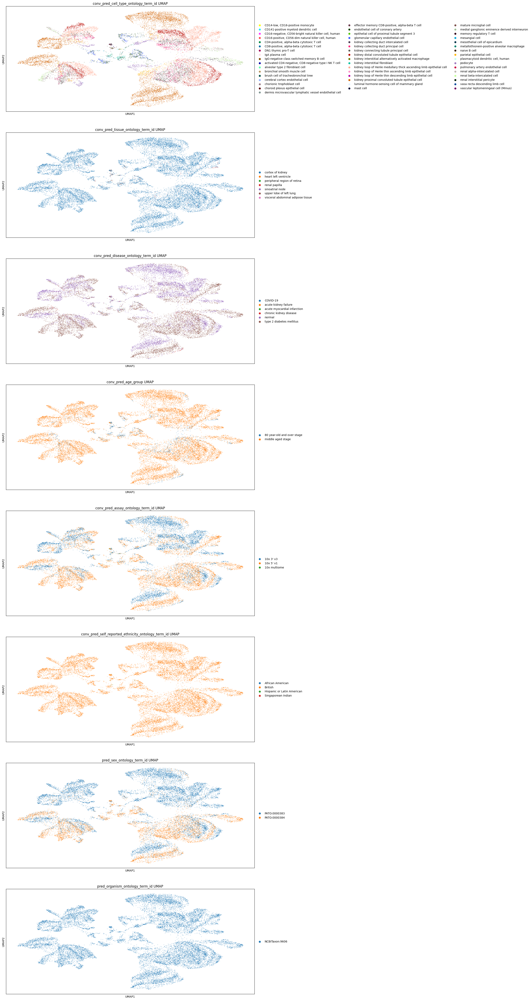

couldn't log to tensorboard
couldn't log to wandb
too few cells to compute a clustering
     cell_type_ontology_term_id
     accuracy: 0.8400197872866683
 
     tissue_ontology_term_id
     accuracy: 0.9876824140489735
 
     disease_ontology_term_id
     accuracy: 0.9086816720257235
 
     assay_ontology_term_id
     accuracy: 0.9427652733118971
 
     self_reported_ethnicity_ontology_term_id
     accuracy: 0.9959162394647667
 
     sex_ontology_term_id
     accuracy: 0.949344546129112
 
     organism_ontology_term_id
     accuracy: 1.0
 


In [9]:
#cell type
n_adata, metrics = embed(model, adata.copy(), cache=False)

In [10]:
embed = Embedder(how="random expr", max_len=4000, add_zero_genes=0, num_workers=16, pred_embedding = ["sex_ontology_term_id"], keep_all_cls_pred=False, output_expression="none")

/home/ml4ig1/Documents code/scDataLoader/scdataloader/utils.py:400: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  organismdf = pd.concat(organismdf)
100%|██████████| 316/316 [02:10<00:00,  2.42it/s]


AnnData object with n_obs × n_vars = 20215 × 44756
    obs: 'pred_cell_type_ontology_term_id', 'pred_tissue_ontology_term_id', 'pred_disease_ontology_term_id', 'pred_age_group', 'pred_assay_ontology_term_id', 'pred_self_reported_ethnicity_ontology_term_id', 'pred_sex_ontology_term_id', 'pred_organism_ontology_term_id', 'conv_pred_cell_type_ontology_term_id', 'conv_pred_tissue_ontology_term_id', 'conv_pred_disease_ontology_term_id', 'conv_pred_age_group', 'conv_pred_assay_ontology_term_id', 'conv_pred_self_reported_ethnicity_ontology_term_id'
    obsm: 'scprint_emb'
    layers: 'scprint_mu', 'scprint_theta', 'scprint_pi'


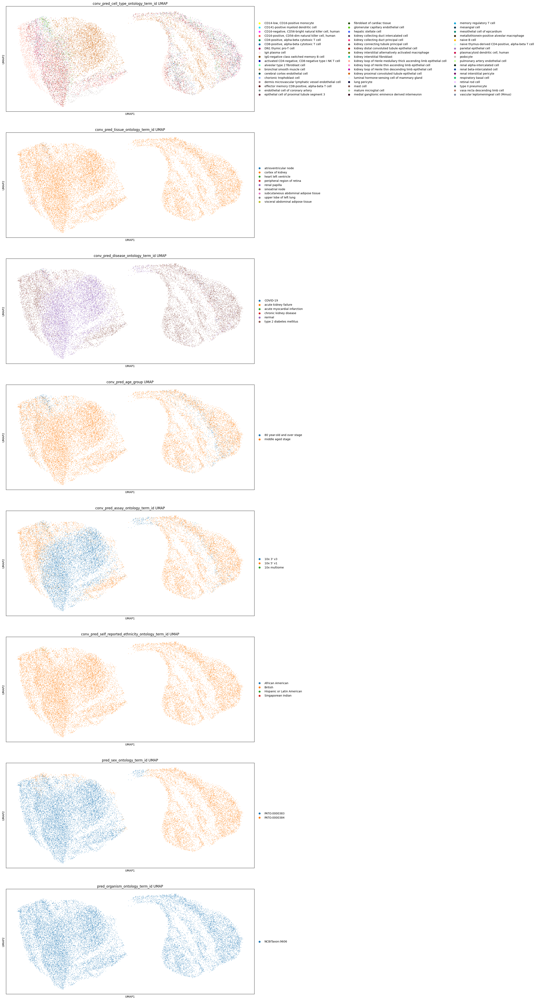

couldn't log to tensorboard
couldn't log to wandb
too few cells to compute a clustering
     cell_type_ontology_term_id
     accuracy: 0.8394261686866189
 
     tissue_ontology_term_id
     accuracy: 0.987336136532278
 
     disease_ontology_term_id
     accuracy: 0.9077912441256493
 
     assay_ontology_term_id
     accuracy: 0.9433094236952758
 
     self_reported_ethnicity_ontology_term_id
     accuracy: 0.9960031279867929
 
     sex_ontology_term_id
     accuracy: 0.9497897600791492
 
     organism_ontology_term_id
     accuracy: 1.0
 


In [11]:
# sex
n_adata, metrics = embed(model, adata.copy(), cache=False)

In [77]:
embed = Embedder(how="random expr", max_len=4000, add_zero_genes=0, num_workers=16, pred_embedding = ["assay_ontology_term_id"], keep_all_cls_pred=False, output_expression="none")

/home/ml4ig1/Documents code/scDataLoader/scdataloader/utils.py:400: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  organismdf = pd.concat(organismdf)
100%|██████████| 316/316 [02:18<00:00,  2.28it/s]


AnnData object with n_obs × n_vars = 20215 × 44756
    obs: 'pred_cell_type_ontology_term_id', 'pred_tissue_ontology_term_id', 'pred_disease_ontology_term_id', 'pred_age_group', 'pred_assay_ontology_term_id', 'pred_self_reported_ethnicity_ontology_term_id', 'pred_sex_ontology_term_id', 'pred_organism_ontology_term_id', 'conv_pred_cell_type_ontology_term_id', 'conv_pred_tissue_ontology_term_id', 'conv_pred_disease_ontology_term_id', 'conv_pred_age_group', 'conv_pred_assay_ontology_term_id', 'conv_pred_self_reported_ethnicity_ontology_term_id'
    obsm: 'scprint_emb'
    layers: 'scprint_mu', 'scprint_theta', 'scprint_pi'


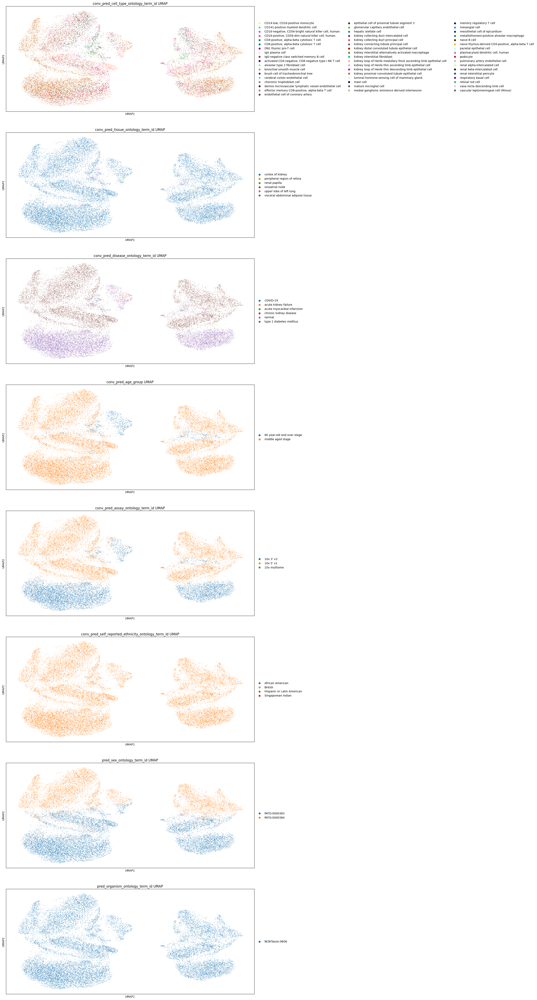

couldn't log to tensorboard
couldn't log to wandb
too few cells to compute a clustering
     cell_type_ontology_term_id
     accuracy: 0.8394756369032896
 
     tissue_ontology_term_id
     accuracy: 0.9876824140489735
 
     disease_ontology_term_id
     accuracy: 0.9079891169923324
 
     assay_ontology_term_id
     accuracy: 0.9425674004452139
 
     self_reported_ethnicity_ontology_term_id
     accuracy: 0.9962637935528716
 
     sex_ontology_term_id
     accuracy: 0.9499381647291615
 
     organism_ontology_term_id
     accuracy: 1.0
 


In [107]:
# assay
n_adata, metrics = embed(model, adata.copy(), cache=False)

In [110]:
sc.pp.neighbors(n_adata, use_rep="scprint_emb")

... storing 'symbol' as categorical
... storing 'ncbi_gene_ids' as categorical
... storing 'biotype' as categorical
... storing 'synonyms' as categorical
... storing 'description' as categorical
... storing 'organism' as categorical


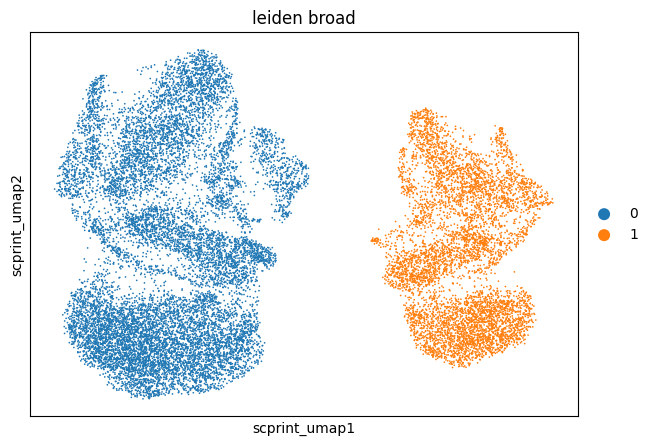

In [111]:
# Rerun leiden clustering with parameters to get fewer clusters
sc.tl.leiden(n_adata, resolution=0.01, key_added='leiden_broad')

# Plot the new clustering to verify we have 2 main clusters
sc.pl.scatter(n_adata, basis="scprint_umap", color="leiden_broad")

In [120]:
n_adata.obs['totmt'] = n_adata.obs['nCount_RNA'] * n_adata.obs['percent.mt']

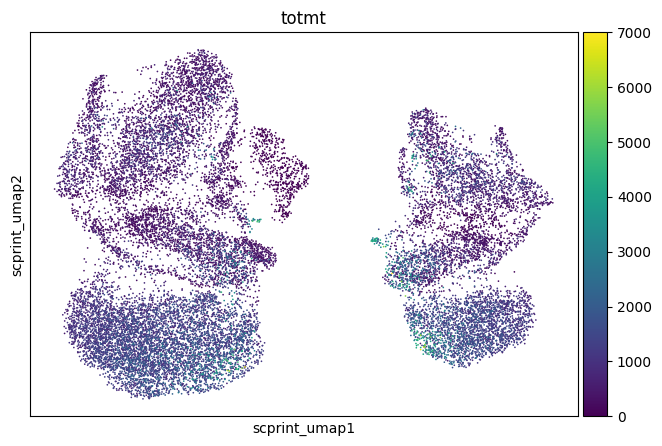

In [121]:
sc.pl.scatter(n_adata, basis="scprint_umap", color="totmt")

/home/ml4ig1/miniconda3/envs/scprnt2/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:387: RuntimeWarning: invalid value encountered in log1p
  np.log1p(X, out=X)
/home/ml4ig1/miniconda3/envs/scprnt2/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/ml4ig1/miniconda3/envs/scprnt2/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(


Top differentially expressed genes between clusters:
             names     scores  logfoldchanges         pvals     pvals_adj
0  ENSG00000212907  53.827976             NaN  0.000000e+00  0.000000e+00
1  ENSG00000228253  15.631965             NaN  4.409941e-55  8.427039e-52
2  ENSG00000198712   7.756228       -0.370750  8.749241e-15  1.546516e-11
3  ENSG00000198886   6.013812       -0.295750  1.812103e-09  1.095068e-06
4  ENSG00000228696   5.003260       -0.349376  5.636900e-07  1.274476e-04
5  ENSG00000198938   4.819795       -0.201895  1.437058e-06  2.716731e-04
6  ENSG00000198763   4.472721       -0.214804  7.723064e-06  1.066507e-03
7  ENSG00000198727   3.937106       -0.217820  8.247013e-05  6.983195e-03
8  ENSG00000198786   3.632966       -0.189676  2.801825e-04  1.906472e-02
9  ENSG00000183474   2.661165       -0.185130  7.787078e-03  2.594616e-01


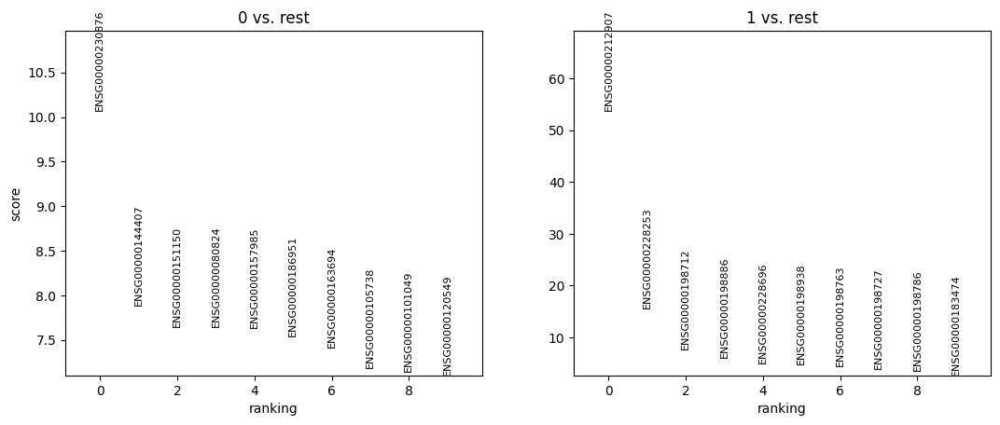

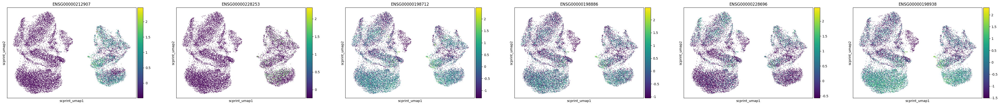

In [112]:
# Perform differential expression analysis between the two clusters
sc.pp.scale(n_adata)
sc.pp.log1p(n_adata)
sc.tl.rank_genes_groups(n_adata, 'leiden_broad', method='wilcoxon')

# Get results table
diff_expr_results = sc.get.rank_genes_groups_df(n_adata, group='1')

# Show top differentially expressed genes
print(f"Top differentially expressed genes between clusters:")
print(diff_expr_results.head(10))

# Plot expression of top genes
sc.pl.rank_genes_groups(n_adata, n_genes=10, sharey=False)

# Plot expression of top genes on the UMAP
top_genes = diff_expr_results['names'].head(6).tolist()
sc.pl.scatter(n_adata, basis="scprint_umap", color=top_genes)

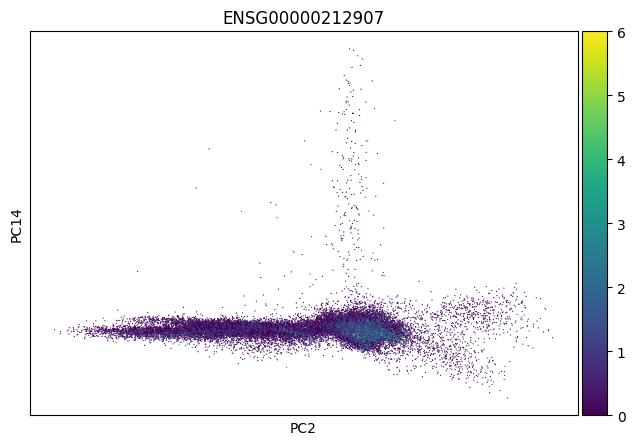

In [ ]:
sc.pl.scatter(adata, basis="pca", components=[2,14], color="ENSG00000212907")

In [45]:
diff_expr_results = sc.get.rank_genes_groups_df(n_adata, group='1')

In [47]:
top_genes = diff_expr_results['names'].head(6).tolist()

In [50]:
top_genes

['ENSG00000212907',
 'ENSG00000228253',
 'ENSG00000198712',
 'ENSG00000198886',
 'ENSG00000198938',
 'ENSG00000228696']

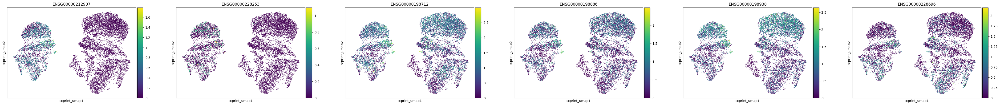

In [48]:
sc.pl.scatter(n_adata, basis="scprint_umap", color=top_genes)

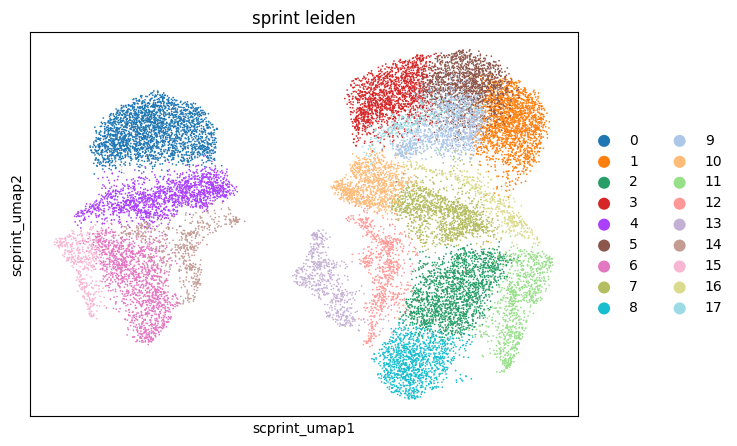

In [31]:
sc.pl.scatter(n_adata, basis="scprint_umap", color="sprint_leiden")

In [37]:
sc.pp.pca(n_adata)

In [39]:
n_adata

AnnData object with n_obs × n_vars = 20215 × 70704
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'nnz', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts

In [40]:
bm = Benchmarker(
    n_adata,
    batch_key="assay_ontology_term_id", #batch, tech
    label_key="cell_type_ontology_term_id", #celltype
    embedding_obsm_keys=["X_pca", "scprint"],
    bio_conservation_metrics=BioConservation(isolated_labels=False),
    batch_correction_metrics=BatchCorrection(),
    n_jobs=20,
)
bm.benchmark()

/home/ml4ig1/miniconda3/envs/scprnt2/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:439: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)
Embeddings:   0%|          | 0/2 [00:00<?, ?it/s]/home/ml4ig1/miniconda3/envs/scprnt2/lib/python3.10/site-packages/scib_metrics/metrics/_graph_connectivity.py:32: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  tab = pd.value_counts(comps)
Embeddings:  50%|█████     | 1/2 [01:45<01:45, 105.64s/it]/home/ml4ig1/miniconda3/envs/scprnt2/lib/python3.10/site-packages/scib_metrics/metrics/_graph_connectivity.py:32: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.


In [16]:
bm.get_results(min_max_scale=False)

,KMeans NMI,KMeans ARI,Silhouette label,cLISI,Silhouette batch,iLISI,KBET,Graph connectivity,PCR comparison,Batch correction,Bio conservation,Total
Embedding,,,,,,,,,,,,
X_pca,0.177321,-0.039478,0.140068,0.999792,0.723802,0.064388,0.123903,0.647066,0.0,0.311832,0.319426,0.316388
scprint,0.410928,0.202392,0.510228,0.996644,0.847743,0.009586,0.170718,0.765628,0,0.358735,0.530048,0.461523
Metric Type,Bio conservation,Bio conservation,Bio conservation,Bio conservation,Batch correction,Batch correction,Batch correction,Batch correction,Batch correction,Aggregate score,Aggregate score,Aggregate score


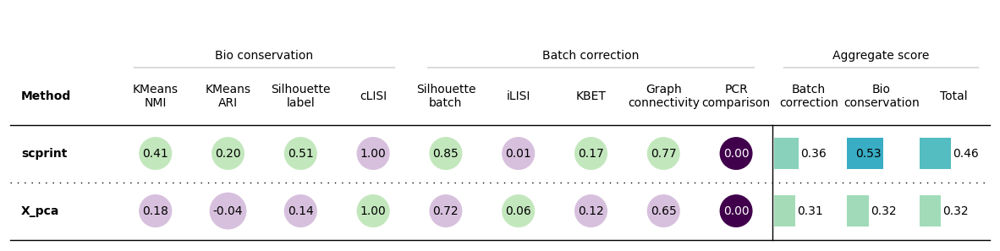

In [17]:
bm.plot_results_table(min_max_scale=False)